- - -
**File name**: evaluation_wrf.ipynb

**Author**:  Ueslei Adriano Sutil

**Email**: [ueslei@outlook.com](mailto:ueslei@outlook.com)

**Created**: 30 September 2020

**Last modified**: 09 October 2020

**Version**: 2.0

**Python**: 3.7.9
- - -
<br>


<h4>1. Import libraries</h4>

In [1]:
from scipy.ndimage.filters import gaussian_filter
from cartopy.feature import NaturalEarthFeature, LAND, COASTLINE
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np
import cartopy.crs as ccrs
import cmocean


Bad key savefig.frameon in file /home/ueslei/anaconda3/envs/Work/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle, line 421 ('savefig.frameon : True')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.3.3/matplotlibrc.template
or from the matplotlib source distribution

Bad key verbose.level in file /home/ueslei/anaconda3/envs/Work/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle, line 472 ('verbose.level  : silent      # one of silent, helpful, debug, debug-annoying')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.3.3/matplotlibrc.template
or from the matplotlib source distribution

Bad key verbose.fileo in file /home/ueslei/anaconda3/envs/Work/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle, line 473 ('verbose.fileo  : sys.stdout  # a log filename, sys.stdout or sys.stderr'

<h4>2. Open file, slice desired coords and load sliced variables.</h4>

In [3]:
# Open ETOPO1 file and slice desired area.
etopo = xr.open_dataset('/media/ueslei/Ueslei_HD/Scripts/Python/Auxiliares/OceanLab/etopo1.nc')

# Slice desired coordinates.
etopo = etopo.sel(x=slice(-53,-44), y=slice(-31,-23))  

# Load sliced variables.
lat = etopo.y
lon = etopo.x
topo = etopo.z

<h4> 3. Create figure and plot ETOPO1 data. </h4>

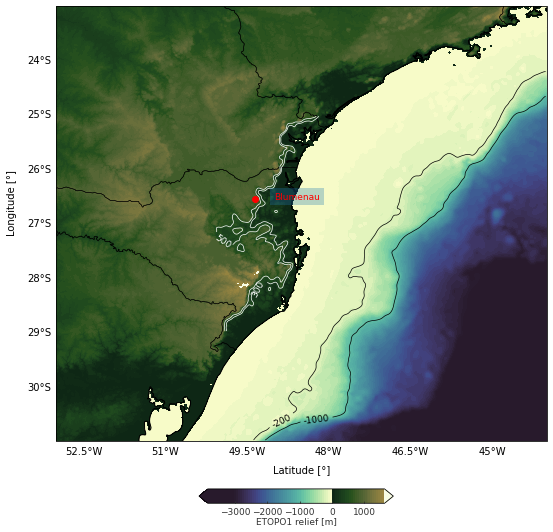

In [4]:
# Create figure.
fig  = plt.figure(1,figsize=(10,8))  

# Use Cartopy projection.
ax = plt.axes(projection=ccrs.PlateCarree())

# Add Cartopy coastines.
ax.coastlines()

# Add gridlines into the figure. We disable interior gridline but 
# keeped the labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=2, color='black', 
                  alpha=0.0, linestyle='--')

# Disable top and right grid line labels.
gl.top_labels = gl.right_labels = False

# Add 1000 and 200 meters bathymetry lines.
bathy_levels = [-1000,-200]    
Ct               = ax.contour(gaussian_filter(lon,2),gaussian_filter(lat,2),gaussian_filter(topo,2),
                              bathy_levels,colors='black',latlon=True,linewidths=0.7,linestyles='solid')
manual_locations = [(-48.2,-31),(-49,-30.5)]       
clbls            = plt.clabel(Ct,fmt='%i', fontsize=9,manual=manual_locations,colors="black")

# Add 300 and 500 meters topography line over Santa Catarina State.
etopo1 = etopo.sel(x=slice(-50.2,-48), y=slice(-29,-25))   
# Load sliced variables.
lat1 = etopo1.y
lon1 = etopo1.x
topo1 = etopo1.z
topo_levels = [300,500] 
Ct2 = ax.contour(gaussian_filter(lon1,2),gaussian_filter(lat1,2),gaussian_filter(topo1,2),
                               topo_levels,colors='white',latlon=True,linewidths=0.7,linestyles='solid')
manual_locations2 = [(-49.3,-28.2),(-49.9,-27.2)]       
clbls2            = plt.clabel(Ct2,fmt='%i', fontsize=9,manual=manual_locations2,colors="white")

# Create min and max data range (and spacing).
clevs = np.arange(-3000,1900,5)

# Plot ETOPO1 data using beautiful cmocean olor pallete.
plot = ax.contourf(lon, lat, topo, 100, cmap=cmocean.cm.topo, 
                   transform=ccrs.PlateCarree(),latlon=True,
                   vmin=-3000, vmax=3000,extend="both")
# Draw Brazilian states.                   
states = NaturalEarthFeature(category='cultural', scale='10m', facecolor='none',
                             name='admin_1_states_provinces_shp')
_ = ax.add_feature(states, edgecolor='black',linewidth=0.5)

# Add Latitude/Longitude text labels.
ax.text(-0.08, 0.55, 'Longitude'u' [\N{DEGREE SIGN}]', va='bottom', ha='center',
        rotation='vertical', rotation_mode='anchor',
        transform=ax.transAxes)
ax.text(0.5, -0.075, 'Latitude'u' [\N{DEGREE SIGN}]', va='bottom', ha='center',
        rotation='horizontal', rotation_mode='anchor',
        transform=ax.transAxes)

# Add text and marker to highlight locations.
ax.text(-49,-26.55, 'Blumenau',color='red',fontsize=9, bbox=dict(fill=True, edgecolor='black', linewidth=0,alpha=0.3))
ax.plot(-49.358,-26.55, color='red', marker='o', linestyle='dashed',linewidth=2, markersize=6)

# Define colobar options (e.g. min/max range, label and where to place into the plot).
ticks  = np.arange(min(clevs),max(clevs),1000)  
cax    = fig.add_axes([0.37, 0.017, 0.27, 0.025]) 
cb     = fig.colorbar(plot, cax=cax, orientation="horizontal",panchor=(0.5,0.5),
                      shrink=0.3,ticks=ticks)   
cb.set_label(r'ETOPO1 relief [m]', fontsize=9, color='0.2',labelpad=0) 
cb.ax.tick_params(labelsize=9, length=2, color='0.2', labelcolor='0.2',
                 direction='in') 
cb.set_ticks(ticks) 

# Save figure.
plt.savefig('./etopo1.png', transparent=False, bbox_inches = 'tight', pad_inches=0, dpi=100)  